In [18]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from scipy.optimize import curve_fit

from astropy.io import fits
from astropy.wcs import WCS

from photutils.detection import DAOStarFinder
from astropy.stats import mad_std

from astropy.stats import sigma_clipped_stats
from astropy.stats import SigmaClip

from astropy import units as u
from photutils.background import Background2D, MedianBackground
from photutils.aperture import aperture_photometry, CircularAnnulus, CircularAperture

import csv

import astrometry
import pandas as pd
import astropy.units as u

import astropy as ap

solver = astrometry.Solver(
    astrometry.series_5200.index_files(
        cache_directory="astrometry_cache",
        scales={1,3},
    )
)

import logging

from reproject import reproject_interp

INFO:root:loaded 96 index files


## Test

Filename: 23feb.0001.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     143   (1365, 1365)   float32   


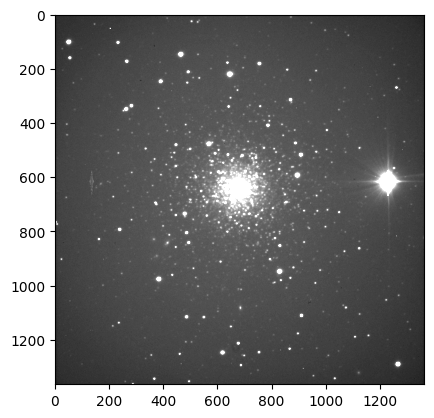

In [3]:
# define the image, open, and read the header information
filename = '23feb.0001.fits'
hdu = fits.open(filename)[0]
image = hdu.data
hdr = hdu.header

# plot the image, with minimum and maximum levels set by percentiles
ax = plt.subplot()
ax.imshow(image,cmap='gray',vmin=150,vmax=500)
fits.info(filename)

## Functions

In [4]:
#defining a function that corrects the bias:
def BiasCorrection(filenum):
    #Defining bias_image
    filename = 'bias.fits'
    hdu = fits.open(filename)[0]
    bias_image = hdu.data
    hdr = hdu.header

    #create a dictionary for the corrected files
    corrected = {}
    
    for i in range(1, filenum+1):
        filename = f'23feb.{i:04d}.fits'
        hdu = fits.open(filename)[0]
        image = hdu.data
        hdr = hdu.header

        #Code from Lab 4
        #get size of image
        h, w = image.shape
        #initialize overscan array
        overscan = []
        
        #calculate mean overscan values
        for j in range(1,h):
            overscan = np.append(overscan,np.mean(image[j,:]))

        #subtract and store in dictionary
        bias = image - bias_image
        filt = hdr.get('FILTER')
        exposure = hdr.get('EXPTIME')
        
        corrected[filename] = {
        'data': bias,
        'filter': filt,
        'exposure': exposure
        }

    #returns the dictionary
    return corrected

In [5]:
#Defining function that flatfields:
def Flatfielding(corrected):
    #create a dictionary of the filters
    flatdict = {
        'Harris-R': 'rflat.fits',
        'Harris-V': 'vflat.fits',
        'Harris-B': 'bflat.fits',
        'Bessell-U': 'uflat.fits',
    }
    #interate across dict
    for file, info in corrected.items():
        data = info['data']
        filt = info['filter']
        #grab flat field fits
        flat = flatdict.get(filt)

        hdu = fits.open(flat)[0]
        flatdata = hdu.data
        
        info['flatdata'] = data / flatdata
    return corrected

In [47]:
#Defining function that finds background
def Background(corrected):
    for file, info in corrected.items():
        image = info['flatdata']
        mean, median, std = sigma_clipped_stats(image, sigma=3.0)
        sigma_clip = SigmaClip(sigma=3.0)
        bkg_estimator = MedianBackground()

        bkg = Background2D(image, (50, 50), filter_size=(3,3),sigma_clip=sigma_clip,bkg_estimator=bkg_estimator)

        image = image - bkg.background
        info['bgsub'] = image
    return corrected

In [71]:
#Defining function that finds stars:
def Starfinding(corrected):
    #blan dictionary for star data
    tables = {}

    #goes through dictionary and uses code from workbook6
    for file, info in corrected.items():
        image = info['bgsub']
        
        bkg_sigma = mad_std(image)

        daofind = DAOStarFinder(fwhm=4.0, threshold=50.0 * bkg_sigma)

        sources = daofind(image)

        for col in sources.colnames:
            sources[col].info.format = '%.8g' 
            
        sources = sources[sources['ycentroid'] >= 1]
        positions = np.transpose((sources['xcentroid'], sources['ycentroid']))

        radii = [3.0, 4.0, 5.0,7.0,10.0,15.0,25.0,40.0]

        apertures = [CircularAperture(positions, r=r) for r in radii]
        
        phot_table = aperture_photometry(image, apertures)
        #adds tables to the dictionary
        tables[file] = phot_table

    return tables

In [72]:
corrected = BiasCorrection(56)
corrected = Flatfielding(corrected)
corrected = Background(corrected)
tables = Starfinding(corrected)

81


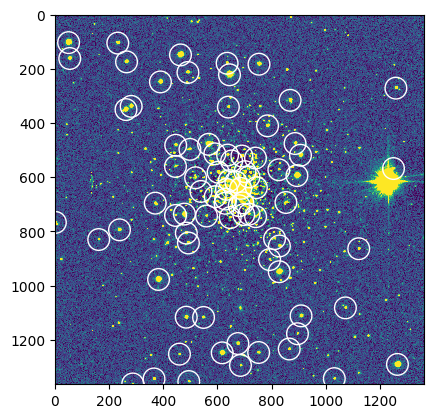

In [79]:
image = corrected['23feb.0001.fits']['bgsub']

tbl = tables['23feb.0001.fits']

x = tbl['xcenter'].value    
y = tbl['ycenter'].value    
print(len(x))
# combine into a 2×N array of (x,y) pairs
positions = np.transpose((x, y))   
plt.imshow(image,interpolation='nearest',vmin=np.percentile(image,2), vmax=np.percentile(image,98))
aperture = CircularAperture(positions, r=40)
ann_patches = aperture.plot(color='white',lw=1)

In [74]:
#Workbook 7 stuff
logging.getLogger().setLevel(logging.INFO)

unit = "pix"
x = tables['23feb.0001.fits']['xcenter'].value
y = tables['23feb.0001.fits']['ycenter'].value

stars = [(x[i],y[i]) for i in range(0,len(x))]

In [75]:
#Workbook 7 stuff
solution = solver.solve(
    stars=stars,
    size_hint=None,
    position_hint=astrometry.PositionHint(
        ra_deg=114.73,
        dec_deg=38,
        radius_deg=1.0),
    solution_parameters=astrometry.SolutionParameters(),
)    

# defines new wcs reference frame using solved for values

if solution.has_match():
    wcs = solution.best_match().astropy_wcs()

INFO:root:solve 16: start
INFO:root:solve 16: slice=[0, 25) (1 / 3), index="5200/index-5201-05.fits" (1 / 2)
INFO:root:solve 16: logodds=270.572, matches=53, conflicts=0, distractors=23, ra=114.542, dec=38.8921, scale=0.426095, index="5200/index-5201-05.fits"
INFO:root:solve 16: logodds=269.849, matches=53, conflicts=0, distractors=23, ra=114.542, dec=38.8922, scale=0.425248, index="5200/index-5201-05.fits"
INFO:root:solve 16: slice=[0, 25) (1 / 3), index="5200/index-5203-05.fits" (2 / 2)
INFO:root:solve 16: slice=[25, 50) (2 / 3), index="5200/index-5201-05.fits" (1 / 2)
INFO:root:solve 16: logodds=287.125, matches=53, conflicts=0, distractors=23, ra=114.541, dec=38.8926, scale=0.427358, index="5200/index-5201-05.fits"
INFO:root:solve 16: logodds=296.382, matches=53, conflicts=0, distractors=23, ra=114.541, dec=38.8925, scale=0.427285, index="5200/index-5201-05.fits"
INFO:root:solve 16: logodds=282.372, matches=53, conflicts=0, distractors=23, ra=114.541, dec=38.8923, scale=0.42708, in

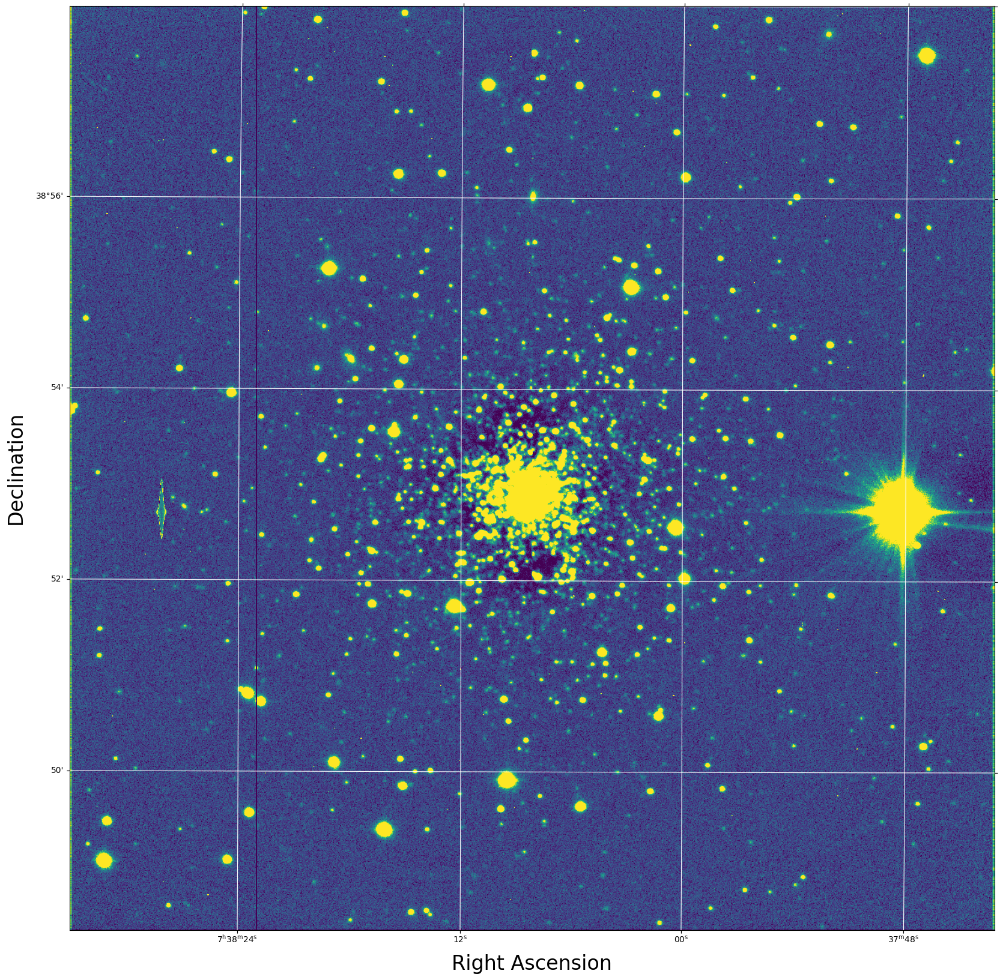

In [76]:
#Background test
image = corrected['23feb.0001.fits']['bgsub']
plt.figure(figsize = (20,20))
plt.subplot(projection=wcs)
plt.imshow(image, vmin=np.percentile(image,2), vmax=np.percentile(image,98))
plt.grid(color='white', ls='solid', alpha=1)
plt.xlabel('Right Ascension',fontsize=24)
plt.ylabel('Declination',fontsize=24)

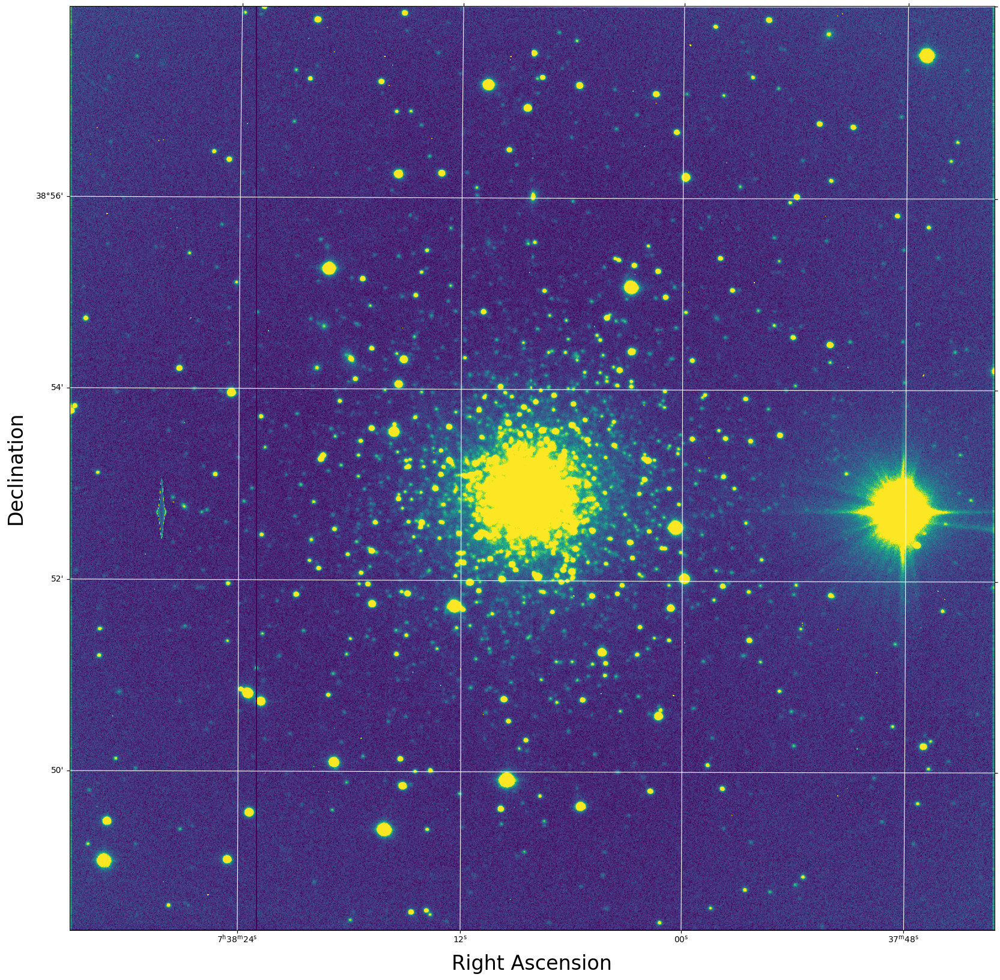

In [78]:
#Flat field test
image = corrected['23feb.0001.fits']['flatdata']
plt.figure(figsize = (20,20))
plt.subplot(projection=wcs)
plt.imshow(image, vmin=np.percentile(image,2), vmax=np.percentile(image,98))
plt.grid(color='white', ls='solid', alpha=1)
plt.xlabel('Right Ascension',fontsize=24)
plt.ylabel('Declination',fontsize=24)